In [1]:
import os
import json
from pathlib import Path

import numpy as np
import pandas as pd
import tifffile as tiff
from PIL import Image

import matplotlib.pyplot as plt

import torch
import torch.nn as nn

from skimage.transform import resize
from skimage.measure import label as sk_label

from cellpose import models

In [2]:
PROJECT_ROOT = Path(r"C:\Users\wangy\Downloads\cnn")
TEST_DIR = PROJECT_ROOT / "test3"

TRAIN_OUT_DIR = PROJECT_ROOT / "outputs" / "train_cnn_pipeline"
MODEL_BUNDLE_PATH = TRAIN_OUT_DIR / "model" / "cnn.pt"

OUT_DIR = PROJECT_ROOT / "outputs" / "result_0430"
PRED_MASK_DIR = OUT_DIR / "predicted_masks"
DEFAULT_MASK_DIR = OUT_DIR / "default_masks"
RANDOM_MASK_DIR = OUT_DIR / "random_masks"
COMPARE_DIR = OUT_DIR / "comparisons"

for d in [OUT_DIR, PRED_MASK_DIR, DEFAULT_MASK_DIR, RANDOM_MASK_DIR, COMPARE_DIR]:
    d.mkdir(parents=True, exist_ok=True)

IMAGE_EXTS = {".png", ".bmp", ".tif", ".tiff", ".jpg", ".jpeg"}

USE_GPU = True
DEVICE = torch.device("cuda" if USE_GPU and torch.cuda.is_available() else "cpu")

MODEL_TYPE_FALLBACK = "cyto3"
CHANNELS_FALLBACK = [0, 0]

RANDOM_SEED = 42
RNG = np.random.default_rng(RANDOM_SEED)

RANDOM_DIAMETER_RANGE = (15.0, 85.0)
RANDOM_CELLPROB_RANGE = (-2.0, 2.0)
RANDOM_FLOW_RANGE = (0.2, 0.6)

print("DEVICE:", DEVICE)
print("TEST_DIR exists:", TEST_DIR.exists())
print("MODEL_BUNDLE exists:", MODEL_BUNDLE_PATH.exists())


DEVICE: cuda
TEST_DIR exists: True
MODEL_BUNDLE exists: True


In [3]:
def list_images(folder):
    folder = Path(folder)
    return sorted([p for p in folder.iterdir() if p.is_file() and p.suffix.lower() in IMAGE_EXTS])

def read_image_any(path):
    path = Path(path)
    ext = path.suffix.lower()
    if ext in {".tif", ".tiff"}:
        arr = tiff.imread(str(path))
    else:
        arr = np.array(Image.open(path))

    arr = np.asarray(arr)
    if arr.ndim == 3:
        if arr.shape[-1] in (3, 4):
            arr = arr[..., :3].mean(axis=-1)
        else:
            arr = arr[0]

    arr = np.asarray(arr, dtype=np.float32)
    return arr

def normalize_image(img):
    img = np.asarray(img, dtype=np.float32)
    lo = np.percentile(img, 1)
    hi = np.percentile(img, 99)
    if hi <= lo:
        hi = img.max() if img.max() > lo else lo + 1.0
    img = (img - lo) / (hi - lo)
    img = np.clip(img, 0, 1)
    return img.astype(np.float32)

def resize_image_for_cnn(img, out_size):
    img = normalize_image(img)
    if img.shape != (out_size, out_size):
        img = resize(
            img,
            (out_size, out_size),
            preserve_range=True,
            anti_aliasing=True
        ).astype(np.float32)
    return img

def overlay_boundaries(image, mask):
    image = normalize_image(image)
    rgb = np.stack([image, image, image], axis=-1)

    mask_b = mask > 0
    edges = np.zeros_like(mask_b, dtype=bool)
    edges[:-1, :] |= (mask_b[:-1, :] != mask_b[1:, :])
    edges[1:,  :] |= (mask_b[:-1, :] != mask_b[1:, :])
    edges[:, :-1] |= (mask_b[:, :-1] != mask_b[:, 1:])
    edges[:, 1:]  |= (mask_b[:, :-1] != mask_b[:, 1:])

    rgb[edges, 0] = 1.0
    rgb[edges, 1] = 0.0
    rgb[edges, 2] = 0.0
    return rgb

In [4]:
class ParamComboCNN(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(1, 16, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(16, 32, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d((1, 1)),
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128, 64),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(64, num_classes),
        )

    def forward(self, x):
        return self.classifier(self.features(x))

In [5]:
payload = torch.load(MODEL_BUNDLE_PATH, map_location=DEVICE, weights_only=False)

combo_table = pd.DataFrame(payload["combo_table"])
IMG_SIZE = int(payload["img_size"])
MODEL_TYPE = payload.get("model_type", MODEL_TYPE_FALLBACK)
CHANNELS = payload.get("channels", CHANNELS_FALLBACK)

model = ParamComboCNN(num_classes=len(combo_table))
model.load_state_dict(payload["state_dict"])
model = model.to(DEVICE)
model.eval()

print("IMG_SIZE:", IMG_SIZE)
print("MODEL_TYPE:", MODEL_TYPE)
print("CHANNELS:", CHANNELS)
display(combo_table.head())

IMG_SIZE: 128
MODEL_TYPE: cyto3
CHANNELS: [0, 0]


,combo_id,diameter,cellprob_threshold,flow_threshold
0,0,15.0,-2.0,0.2
1,1,15.0,-2.0,0.4
2,2,15.0,-2.0,0.6
3,3,15.0,0.0,0.2
4,4,15.0,0.0,0.4


In [6]:

def get_cellpose_model(use_gpu=True):
    return models.CellposeModel(gpu=use_gpu)

cp_model = get_cellpose_model(DEVICE.type == "cuda")

In [7]:
def predict_combo(model, combo_table_df, image_path, img_size, device):
    img = read_image_any(image_path)
    x = resize_image_for_cnn(img, img_size)
    x = torch.tensor(x[None, None, :, :], dtype=torch.float32).to(device)

    with torch.no_grad():
        logits = model(x)
        pred_class = int(logits.argmax(dim=1).item())

    combo = combo_table_df.loc[combo_table_df["combo_id"] == pred_class].iloc[0].to_dict()
    return pred_class, combo


def sample_random_cellpose_params(rng=RNG):
    """Sample one random Cellpose parameter set for one image."""
    return {
        "diameter": float(rng.uniform(*RANDOM_DIAMETER_RANGE)),
        "cellprob_threshold": float(rng.uniform(*RANDOM_CELLPROB_RANGE)),
        "flow_threshold": float(rng.uniform(*RANDOM_FLOW_RANGE)),
    }


def run_cellpose_segmentation(cp_model, img, channels, params=None):
    """Run Cellpose and return only the mask array.

    params=None uses Cellpose defaults.
    """
    if params is None:
        out = cp_model.eval(img, channels=channels)
    else:
        out = cp_model.eval(
            img,
            channels=channels,
            diameter=float(params["diameter"]),
            cellprob_threshold=float(params["cellprob_threshold"]),
            flow_threshold=float(params["flow_threshold"]),
        )
    return np.asarray(out[0])


In [8]:
test_images = list_images(TEST_DIR)
print("num test images:", len(test_images))

num test images: 50


In [9]:
summary_rows = []

for i, img_path in enumerate(test_images):
    key = img_path.stem
    print(f"[{i+1}/{len(test_images)}] {img_path.name}")

    img = read_image_any(img_path)

    pred_class, combo = predict_combo(model, combo_table, img_path, IMG_SIZE, DEVICE)

    cnn_params = {
        "diameter": float(combo["diameter"]),
        "cellprob_threshold": float(combo["cellprob_threshold"]),
        "flow_threshold": float(combo["flow_threshold"]),
    }
    random_params = sample_random_cellpose_params(RNG)

    pred_masks = run_cellpose_segmentation(cp_model, img, CHANNELS, cnn_params)
    default_masks = run_cellpose_segmentation(cp_model, img, CHANNELS, None)
    random_masks = run_cellpose_segmentation(cp_model, img, CHANNELS, random_params)

    pred_mask_path = PRED_MASK_DIR / f"{key}_predicted_mask.tif"
    default_mask_path = DEFAULT_MASK_DIR / f"{key}_default_mask.tif"
    random_mask_path = RANDOM_MASK_DIR / f"{key}_random_mask.tif"

    tiff.imwrite(str(pred_mask_path), pred_masks.astype(np.int32))
    tiff.imwrite(str(default_mask_path), default_masks.astype(np.int32))
    tiff.imwrite(str(random_mask_path), random_masks.astype(np.int32))

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(overlay_boundaries(img, pred_masks))
    axes[0].set_title(
        f"CNN suggested overlap\nD={cnn_params['diameter']:.2f}, "
        f"CP={cnn_params['cellprob_threshold']:.2f}, F={cnn_params['flow_threshold']:.2f}"
    )

    axes[1].imshow(overlay_boundaries(img, default_masks))
    axes[1].set_title("Cellpose default overlap")

    axes[2].imshow(overlay_boundaries(img, random_masks))
    axes[2].set_title(
        f"Random parameter overlap\nD={random_params['diameter']:.2f}, "
        f"CP={random_params['cellprob_threshold']:.2f}, F={random_params['flow_threshold']:.2f}"
    )

    for ax in axes:
        ax.axis("off")

    plt.tight_layout()
    compare_path = COMPARE_DIR / f"{key}_comparison.png"
    plt.savefig(compare_path, dpi=180, bbox_inches="tight")
    plt.close()

    summary_rows.append({
        "image_name": img_path.name,
        "image_path": str(img_path),
        "pred_combo_id": pred_class,
        "pred_diameter": cnn_params["diameter"],
        "pred_cellprob_threshold": cnn_params["cellprob_threshold"],
        "pred_flow_threshold": cnn_params["flow_threshold"],
        "random_diameter": random_params["diameter"],
        "random_cellprob_threshold": random_params["cellprob_threshold"],
        "random_flow_threshold": random_params["flow_threshold"],
        "pred_mask_path": str(pred_mask_path),
        "default_mask_path": str(default_mask_path),
        "random_mask_path": str(random_mask_path),
        "comparison_figure_path": str(compare_path),
        "pred_num_objects": int(pred_masks.max()) if pred_masks.size else 0,
        "default_num_objects": int(default_masks.max()) if default_masks.size else 0,
        "random_num_objects": int(random_masks.max()) if random_masks.size else 0,
        "pred_foreground_pixels": int((pred_masks > 0).sum()),
        "default_foreground_pixels": int((default_masks > 0).sum()),
        "random_foreground_pixels": int((random_masks > 0).sum()),
    })


[1/50] 397.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
c:\Users\wangy\miniconda3\envs\cellpose\lib\site-packages\cellpose\dynamics.py:524: UserWarning: Sparse invariant checks are implicitly disabled. Memory errors (e.g. SEGFAULT) will occur when operating on a sparse tensor which violates the invariants, but checks incur performance overhead. To silence this warning, explicitly opt in or out. See `torch.sparse.check_sparse_tensor_invariants.__doc__` for guidance.  (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\Context.cpp:767.)
  coo = torch.sparse_coo_tensor(pt, torch.ones(pt.shape[1], device=pt.device, dtype=torch.int),
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[2/50] 398.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[3/50] 399.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[4/50] 401.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[5/50] 402.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[6/50] 403.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[7/50] 404.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[8/50] 405.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[9/50] 406.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[10/50] 407.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[11/50] 408.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[12/50] 409.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[13/50] 410.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[14/50] 411.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[15/50] 412.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[16/50] 413.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[17/50] 414.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[18/50] 417.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[19/50] 419.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[20/50] 420.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[21/50] 422.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[22/50] 423.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[23/50] 424.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[24/50] 426.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[25/50] 428.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[26/50] 429.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[27/50] 430.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[28/50] 432.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[29/50] 433.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[30/50] 434.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[31/50] 435.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[32/50] 437.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[33/50] 438.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[34/50] 440.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[35/50] 441.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[36/50] 443.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[37/50] 444.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[38/50] 445.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[39/50] 447.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[40/50] 448.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[41/50] 449.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[42/50] 450.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[43/50] 452.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[44/50] 453.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[45/50] 454.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[46/50] 455.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[47/50] 456.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[48/50] 458.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[49/50] 461.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


[50/50] 462.png


channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


In [10]:
summary_df = pd.DataFrame(summary_rows)
summary_csv = OUT_DIR / "prediction_vs_default_summary.csv"
summary_df.to_csv(summary_csv, index=False)

print("saved:", summary_csv)
display(summary_df.head())

saved: C:\Users\wangy\Downloads\cnn\outputs\result_0430\prediction_vs_default_summary.csv


,image_name,image_path,pred_combo_id,pred_diameter,pred_cellprob_threshold,pred_flow_threshold,random_diameter,random_cellprob_threshold,random_flow_threshold,pred_mask_path,default_mask_path,random_mask_path,comparison_figure_path,pred_num_objects,default_num_objects,random_num_objects,pred_foreground_pixels,default_foreground_pixels,random_foreground_pixels
0,397.png,C:\Users\wangy\Downloads\cnn\test3\397.png,41,35.0,0.0,0.6,69.176923,-0.244486,0.543439,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,57,28,48,296656,150563,254614
1,398.png,C:\Users\wangy\Downloads\cnn\test3\398.png,41,35.0,0.0,0.6,63.815762,-1.623291,0.590249,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,54,32,29,282800,172400,230217
2,399.png,C:\Users\wangy\Downloads\cnn\test3\399.png,41,35.0,0.0,0.6,68.279779,1.144257,0.251245,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,127,74,26,965403,536511,222467
3,401.png,C:\Users\wangy\Downloads\cnn\test3\401.png,41,35.0,0.0,0.6,46.527016,-0.516808,0.570706,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,39,17,51,120052,65523,232521
4,402.png,C:\Users\wangy\Downloads\cnn\test3\402.png,41,35.0,0.0,0.6,60.070558,1.291046,0.377366,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,C:\Users\wangy\Downloads\cnn\outputs\result_04...,18,12,7,74910,50774,41667


In [11]:
OVERLAY_DIR = OUT_DIR / "overlay_comparisons"
OVERLAY_DIR.mkdir(parents=True, exist_ok=True)

In [12]:
def make_mask_overlay(image, mask, boundary_only=True):
    image = normalize_image(image)
    rgb = np.stack([image, image, image], axis=-1)

    mask_bin = mask > 0

    if boundary_only:
        edges = np.zeros_like(mask_bin, dtype=bool)
        edges[:-1, :] |= (mask_bin[:-1, :] != mask_bin[1:, :])
        edges[1:,  :] |= (mask_bin[:-1, :] != mask_bin[1:, :])
        edges[:, :-1] |= (mask_bin[:, :-1] != mask_bin[:, 1:])
        edges[:, 1:]  |= (mask_bin[:, :-1] != mask_bin[:, 1:])

        rgb[edges, 0] = 1.0
        rgb[edges, 1] = 0.0
        rgb[edges, 2] = 0.0
    else:
        rgb[..., 0] = np.where(mask_bin, 1.0, rgb[..., 0])
        rgb[..., 1] = np.where(mask_bin, 0.3, rgb[..., 1])
        rgb[..., 2] = np.where(mask_bin, 0.3, rgb[..., 2])

    return rgb

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


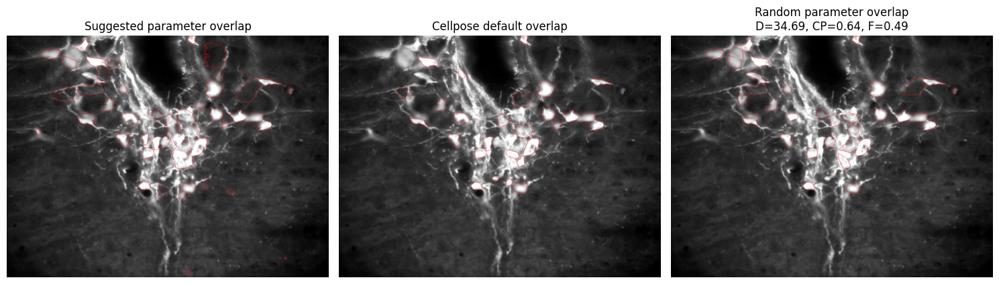

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


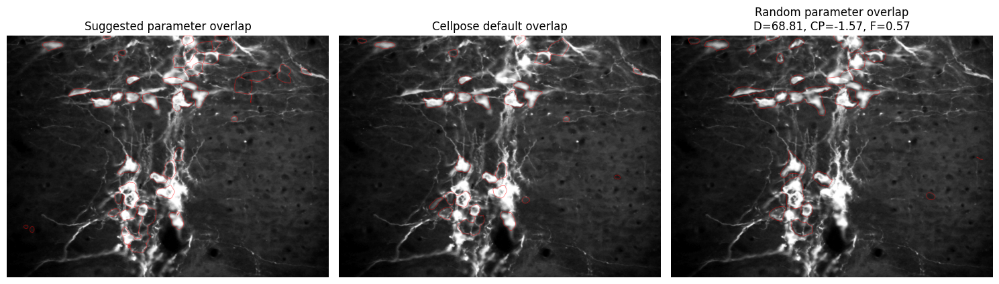

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


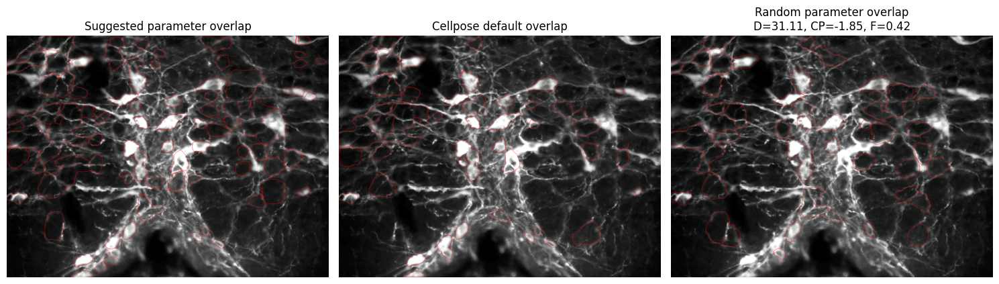

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


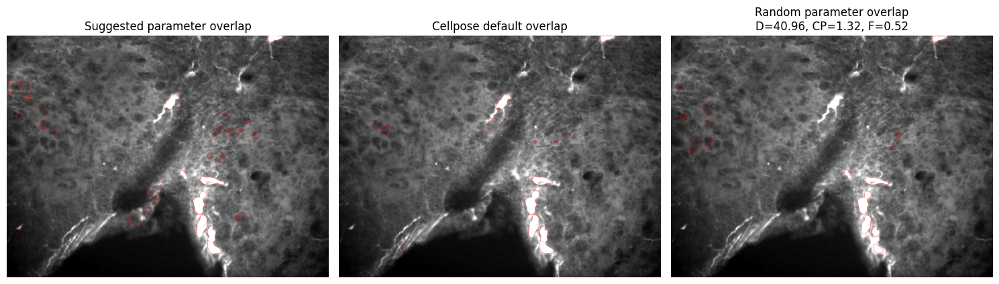

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


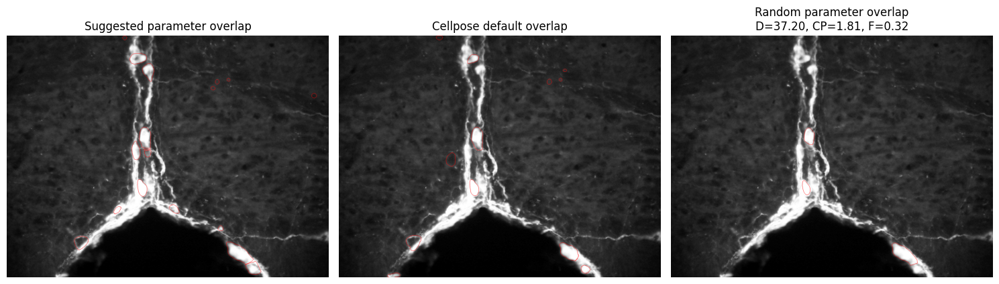

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


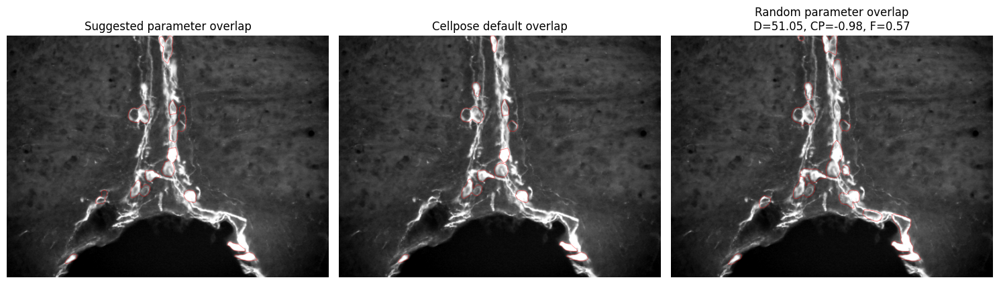

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


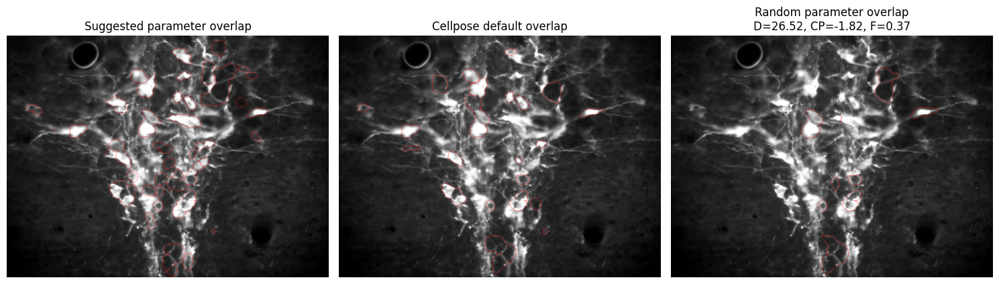

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


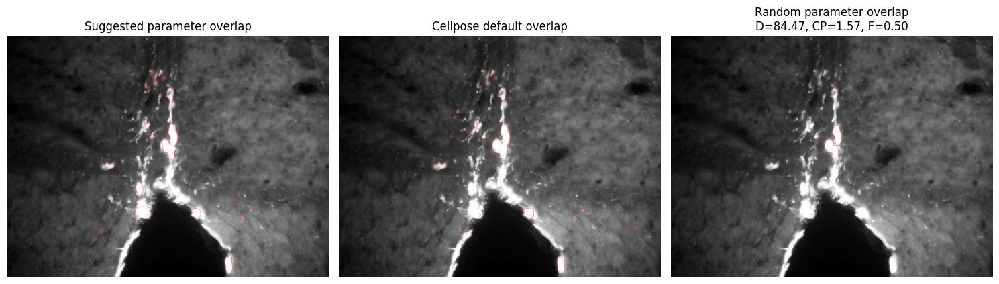

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


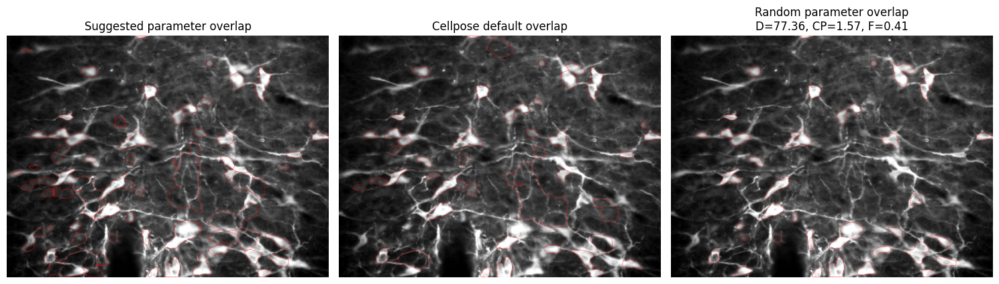

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


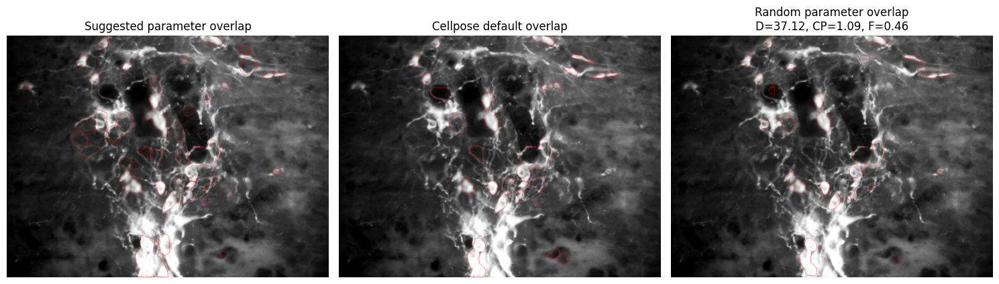

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


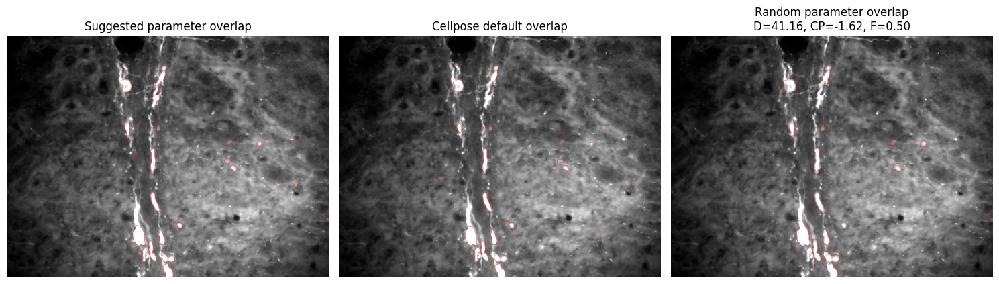

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


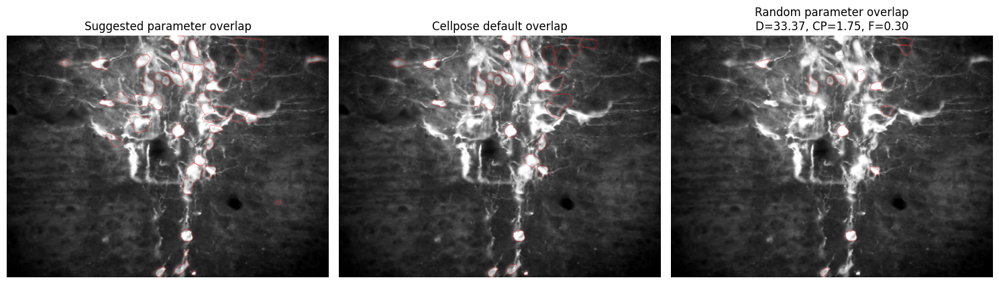

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


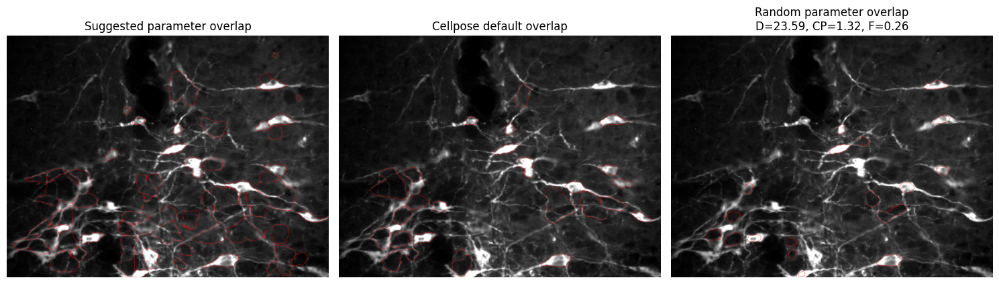

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


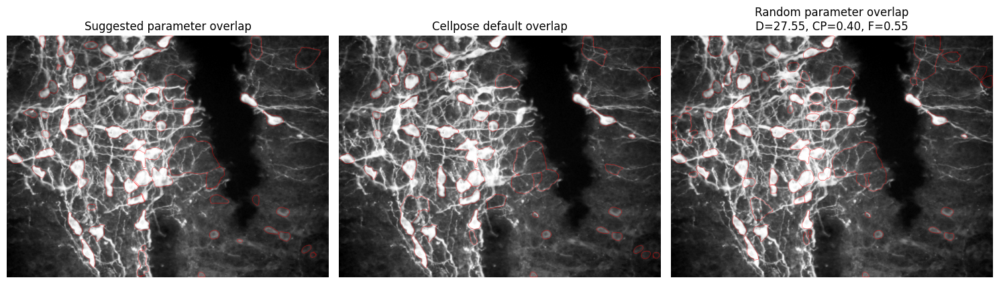

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


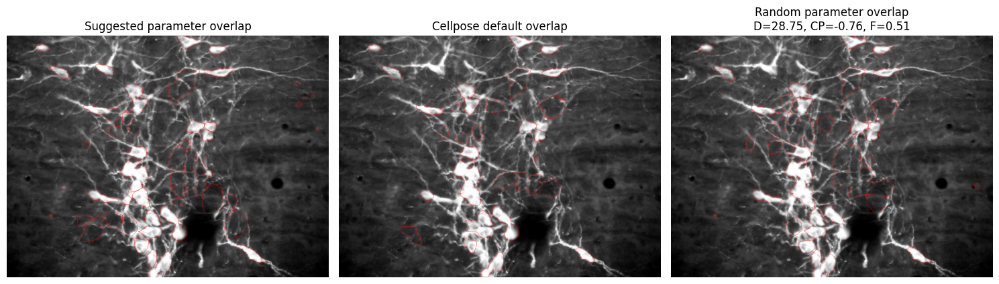

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


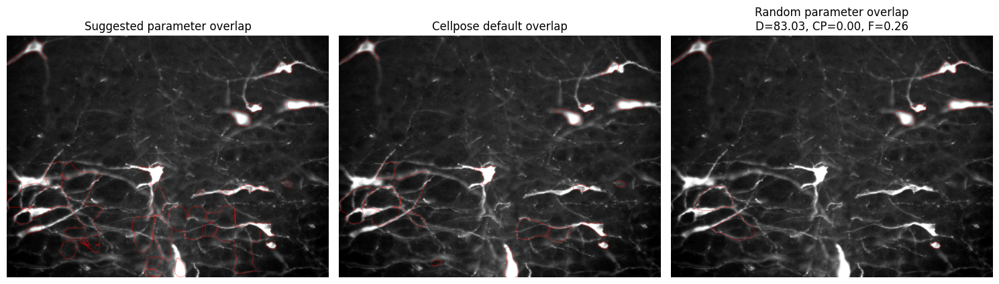

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


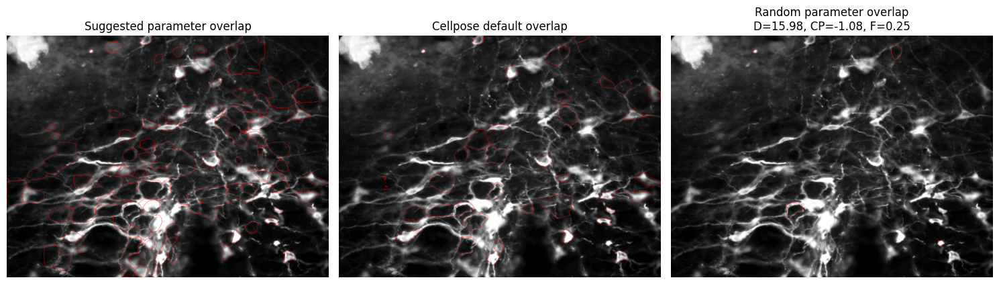

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


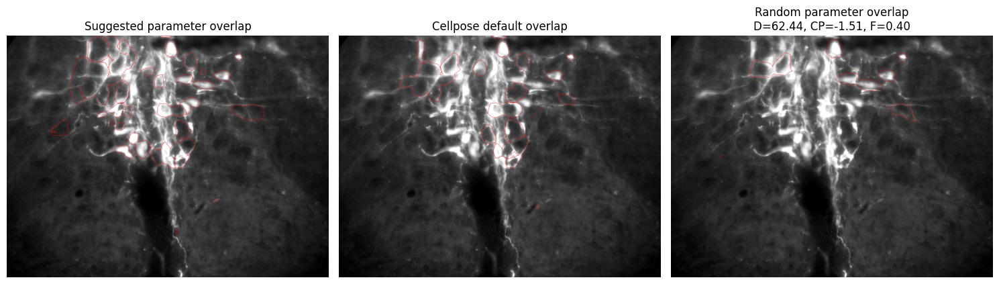

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


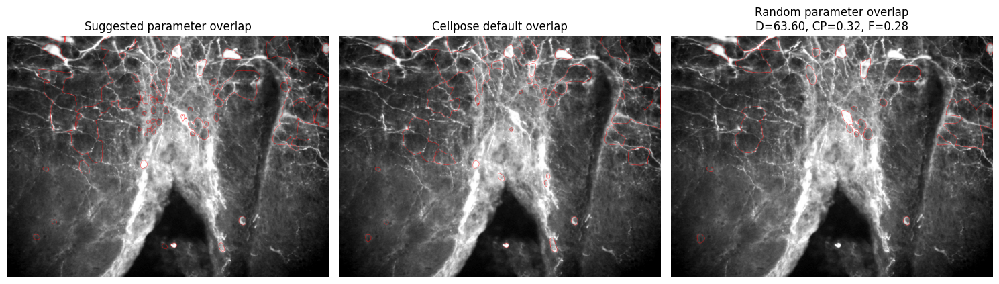

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


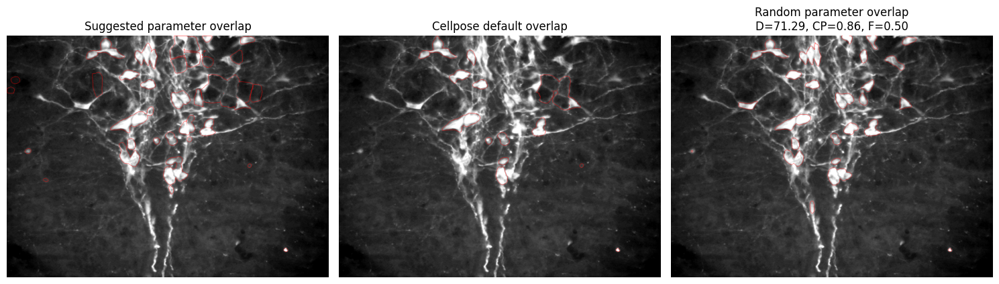

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


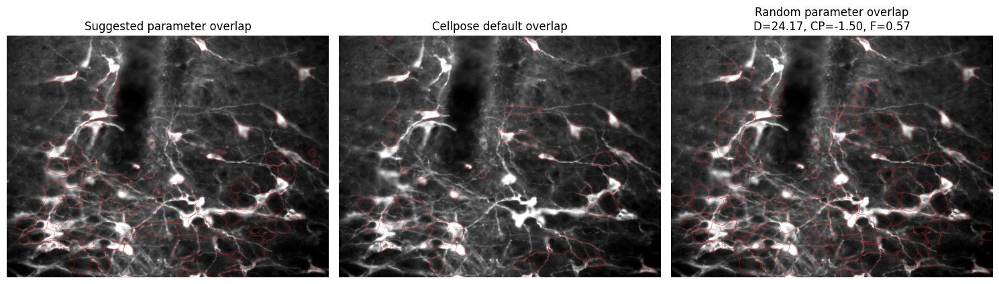

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


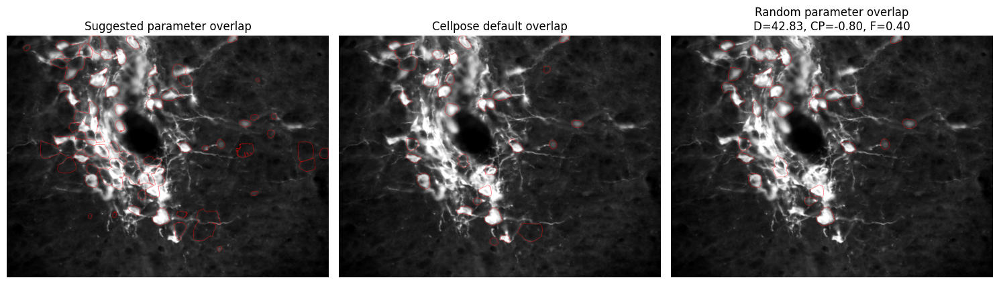

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


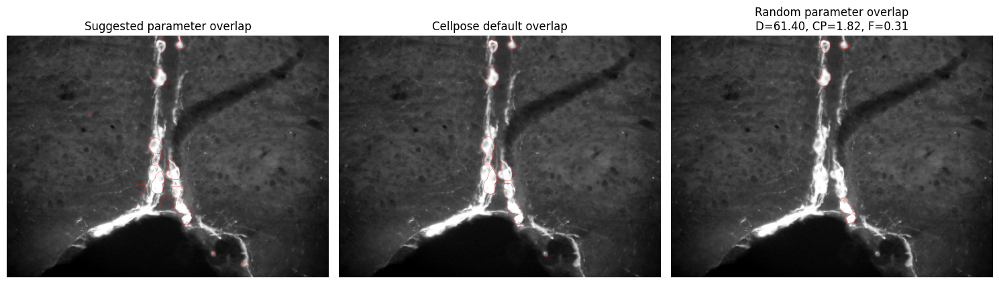

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


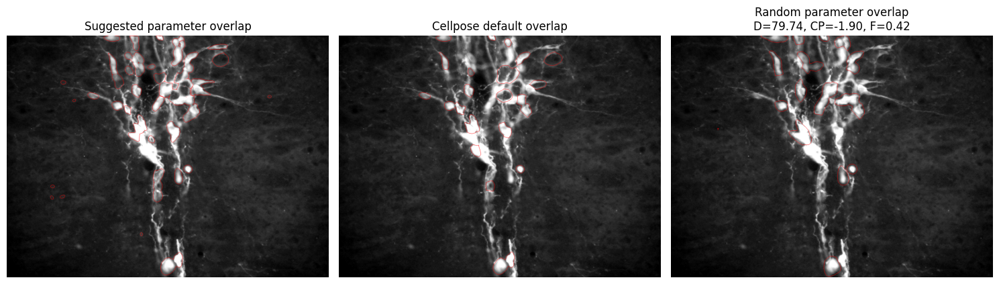

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


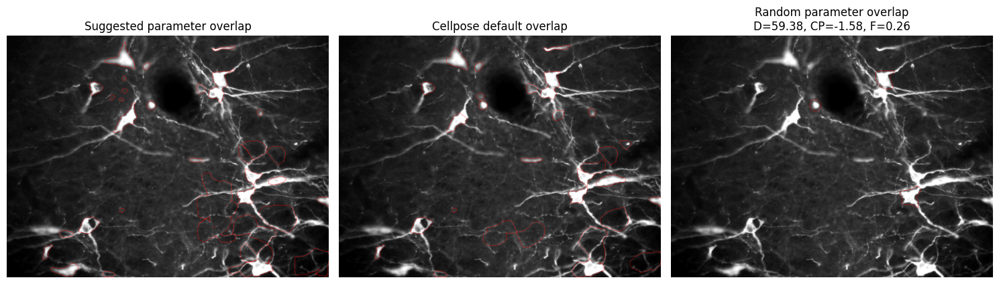

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


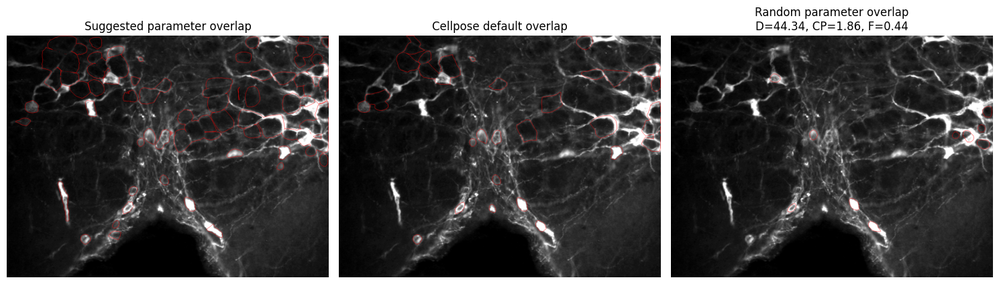

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


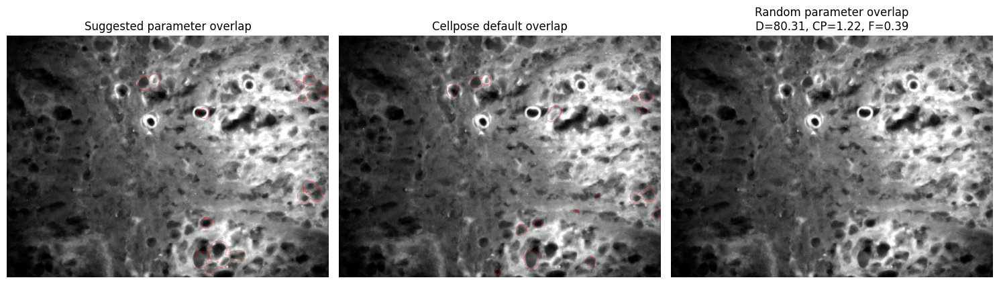

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


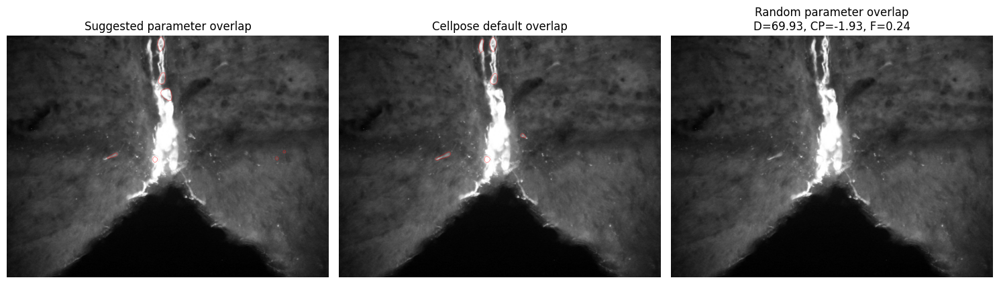

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


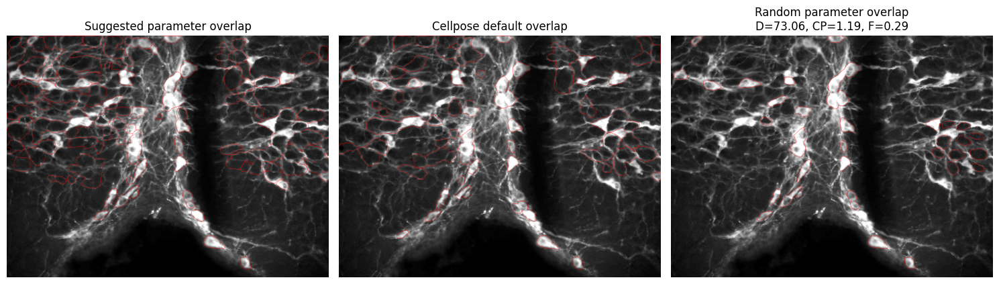

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


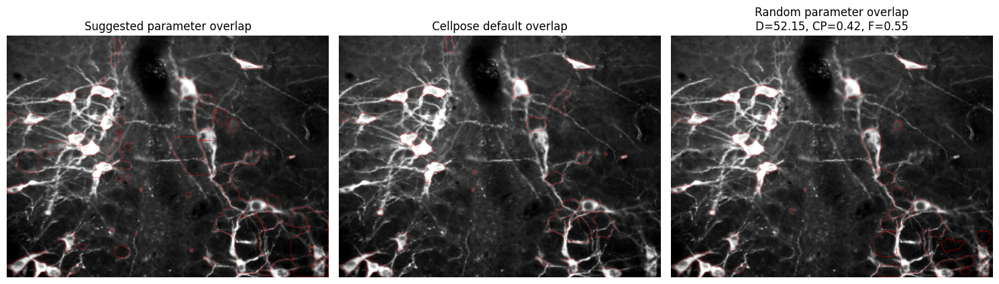

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


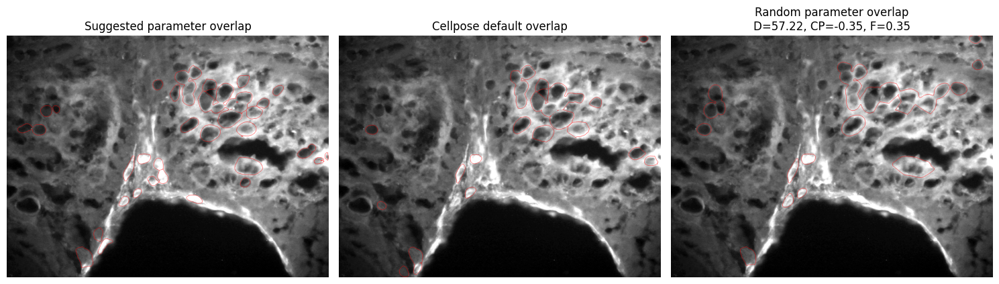

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


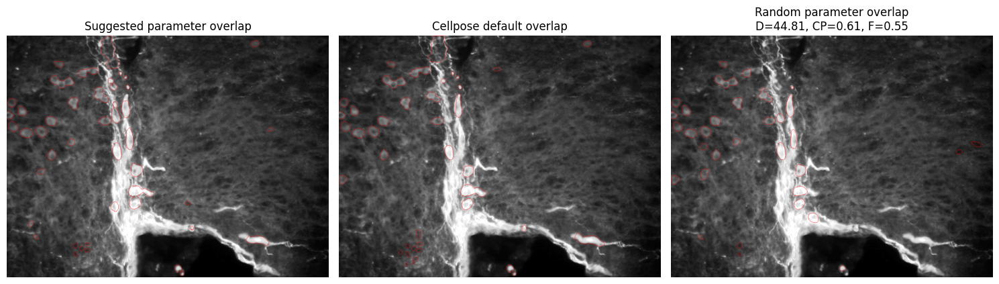

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


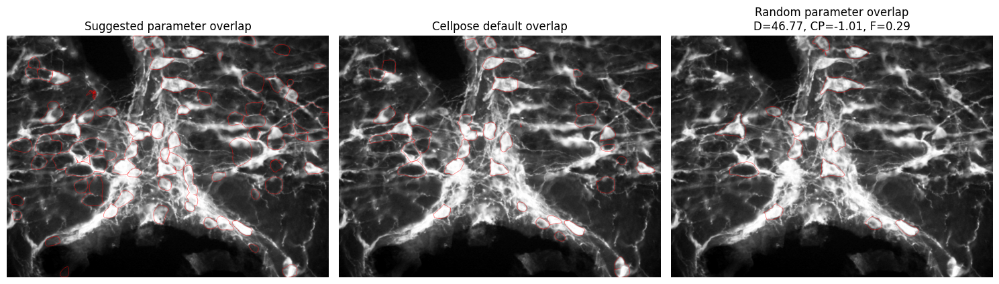

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


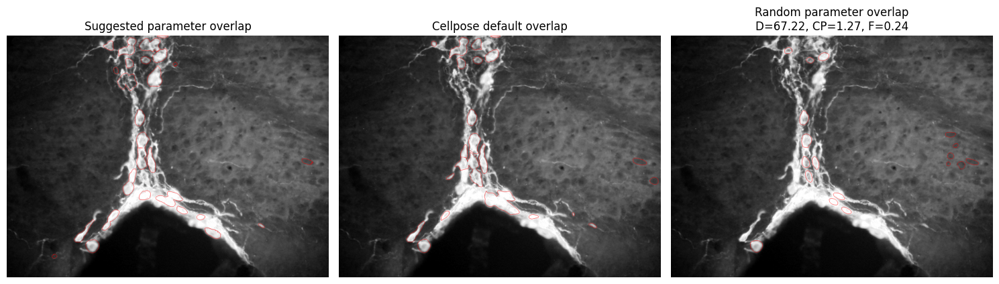

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


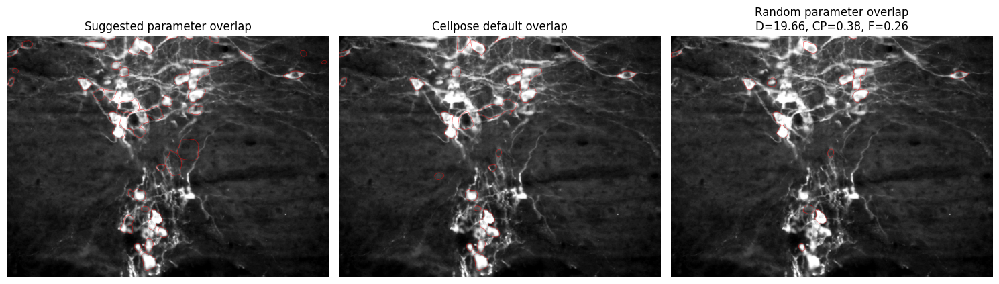

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


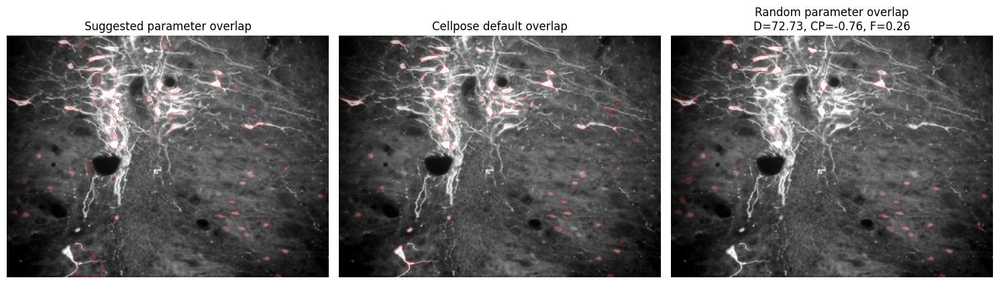

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


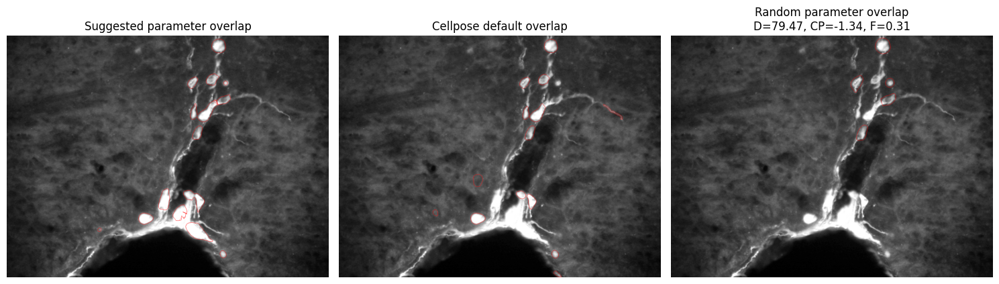

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


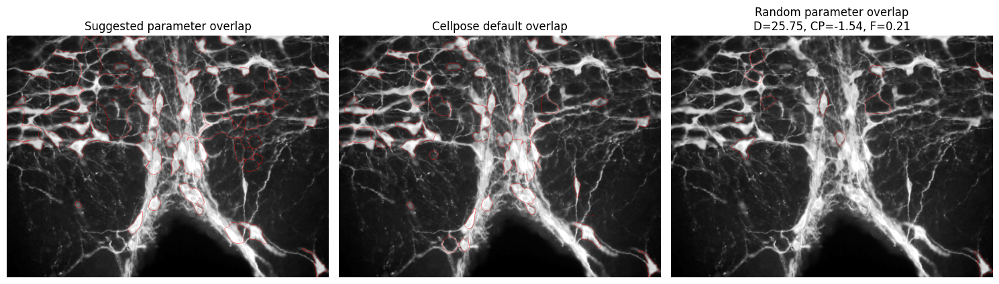

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


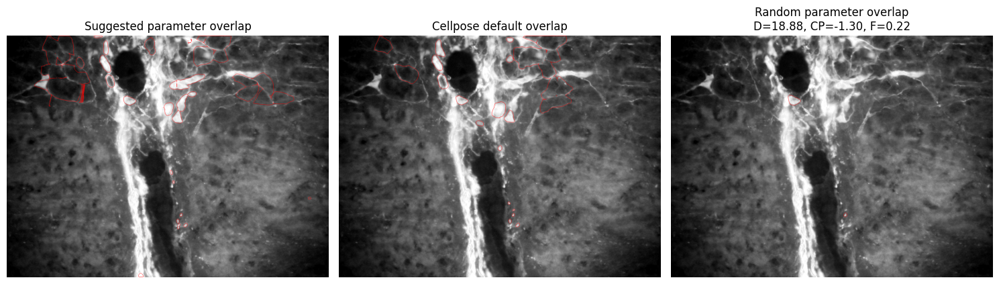

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


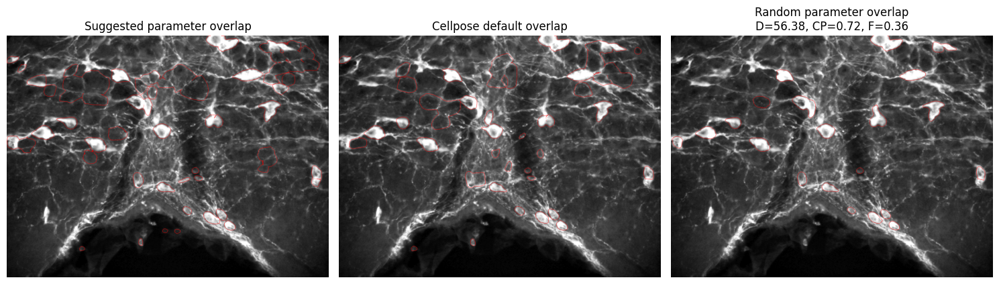

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


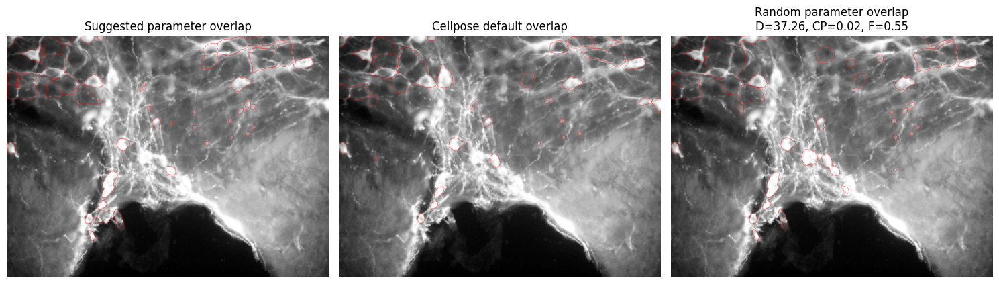

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


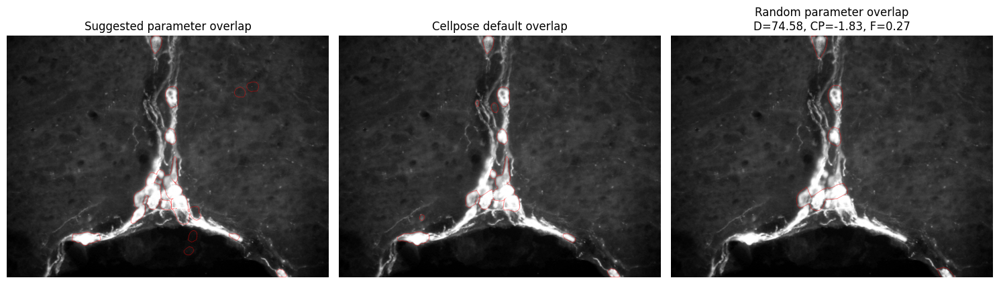

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


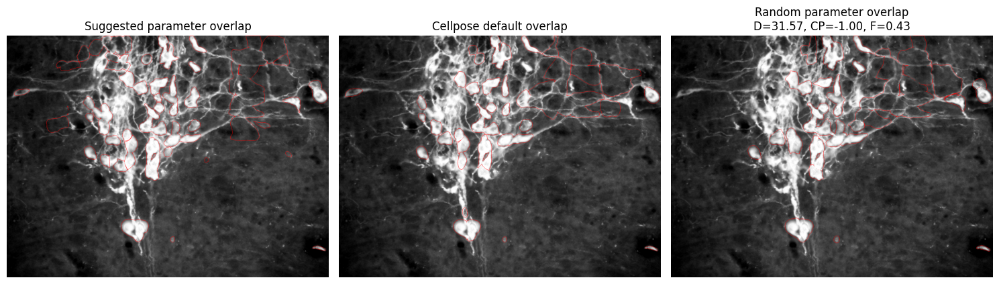

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


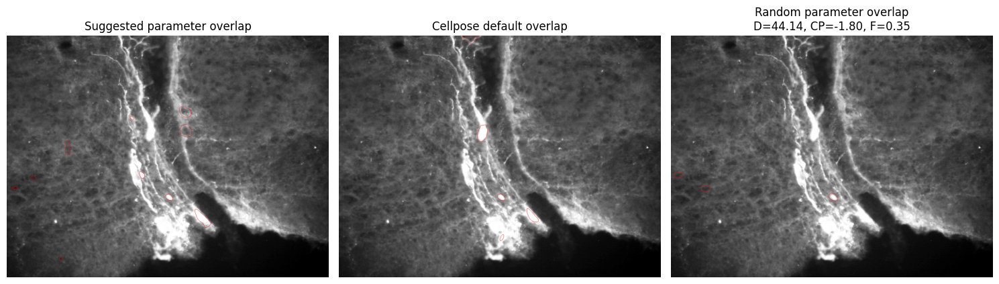

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


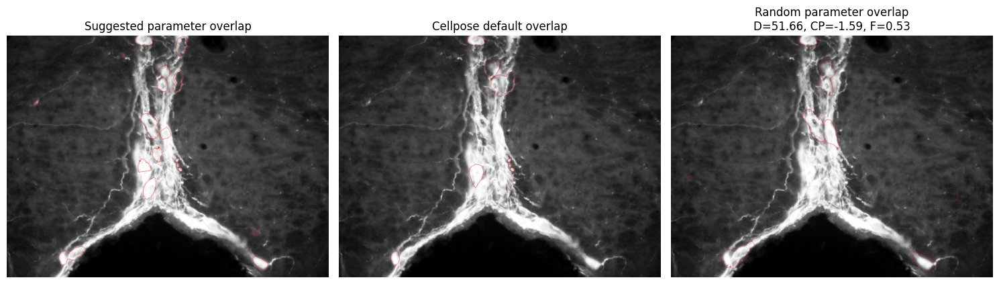

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


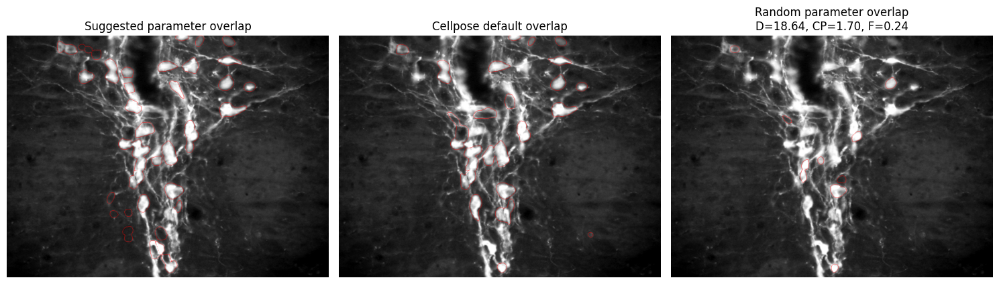

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


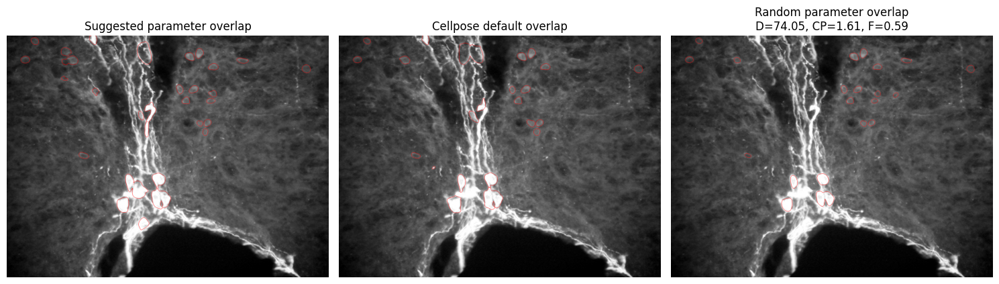

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


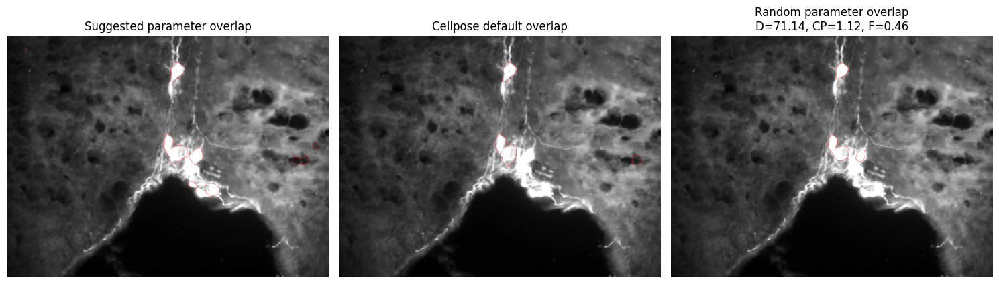

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


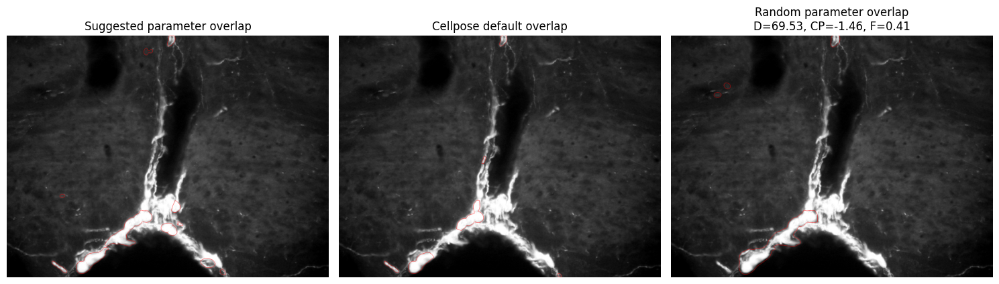

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


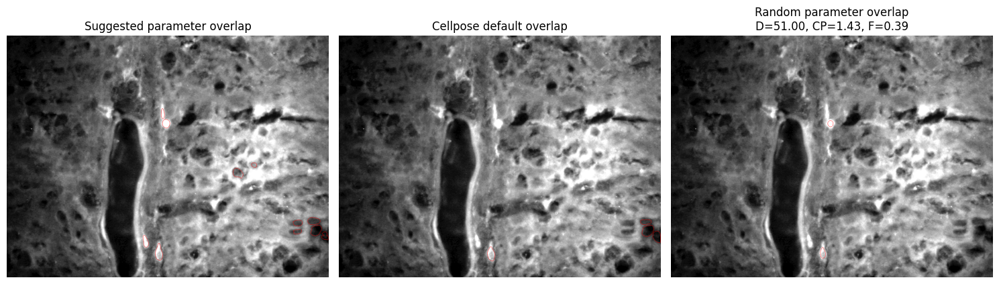

In [14]:


for img_path in test_images:
    img = read_image_any(img_path)

    pred_class, combo = predict_combo(model, combo_table, img_path, IMG_SIZE, DEVICE)

    cnn_params = {
        "diameter": float(combo["diameter"]),
        "cellprob_threshold": float(combo["cellprob_threshold"]),
        "flow_threshold": float(combo["flow_threshold"]),
    }
    random_params = sample_random_cellpose_params(RNG)

    pred_masks = run_cellpose_segmentation(cp_model, img, CHANNELS, cnn_params)
    default_masks = run_cellpose_segmentation(cp_model, img, CHANNELS, None)
    random_masks = run_cellpose_segmentation(cp_model, img, CHANNELS, random_params)

    pred_overlay = make_mask_overlay(img, pred_masks, boundary_only=True)
    default_overlay = make_mask_overlay(img, default_masks, boundary_only=True)
    random_overlay = make_mask_overlay(img, random_masks, boundary_only=True)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(pred_overlay)
    axes[0].set_title("Suggested parameter overlap"
    )

    axes[1].imshow(default_overlay)
    axes[1].set_title("Cellpose default overlap")

    axes[2].imshow(random_overlay)
    axes[2].set_title(
        f"Random parameter overlap\nD={random_params['diameter']:.2f}, "
        f"CP={random_params['cellprob_threshold']:.2f}, F={random_params['flow_threshold']:.2f}"
    )

    for ax in axes:
        ax.axis("off")

    plt.tight_layout()
    save_path = OVERLAY_DIR / f"{Path(img_path).stem}_overlay_compare.png"
    plt.savefig(save_path, dpi=180, bbox_inches="tight")
    plt.show()


Cell 12 now saves the three-panel overlay comparison images. The previous duplicate plotting cell was replaced to avoid rerunning stale variables.
